# BDT

This Jupyter Notebook contains the BDT used for separating the muon neutrino and muon anti-neutrino in the mixed sample containing $\nu_{\mu} + \bar{\nu}_{\mu}$. 

Input taking the .hdr5 files containing the Pandas dataframes for the selected sample.

### Input, importing the selected sample stored into .hdr5 file

In [2]:
#====================#
#  Import Packages   #
#====================#

import math 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import gridspec
import matplotlib.patches as mpatches
import mpltern

import uproot3 as uproot

# BDT
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_curve, auc, recall_score, precision_score, average_precision_score, precision_recall_curve
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from sklearn.utils.class_weight import compute_sample_weight
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
import joblib
import xgboost as xgb
from matplotlib.pylab import rcParams
import plotly.express as px
import seaborn as sns


%run numuNumubarSelection_run3b.ipynb 

/opt/anaconda3/envs/numu_xsec/lib/python3.11/site-packages/nbformat/__init__.py:96: DuplicateCellId: Non-unique cell id 'cfaf661c-9ba3-4c5f-984c-ef61b0f3b2d5' detected. Corrected to 'c6ee3656'.
  validate(nb)
/opt/anaconda3/envs/numu_xsec/lib/python3.11/site-packages/nbformat/__init__.py:96: DuplicateCellId: Non-unique cell id '34c132fc' detected. Corrected to 'e4b12600'.
  validate(nb)
/opt/anaconda3/envs/numu_xsec/lib/python3.11/site-packages/nbformat/__init__.py:96: DuplicateCellId: Non-unique cell id '19933096' detected. Corrected to 'aa202be2'.
  validate(nb)
/opt/anaconda3/envs/numu_xsec/lib/python3.11/site-packages/nbformat/__init__.py:96: DuplicateCellId: Non-unique cell id '2d98d8e8' detected. Corrected to '456187c3'.
  validate(nb)


Run 3 DATA POT = 4.56e+20
Run 3 EXT POT = 1.49e+21
Run 3 MC POT = 2.70e+21
Run 3 DIRT POT = 9.05e+20
[DATA] POT 4.56e+20      1021600 entries
[EXT] POT 1.49e+21      2985979 entries
[MC] POT 2.70e+21      1015441 entries
[DIRT] POT 9.05e+20       304793 entries

Dataframes created.


/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/3510898360.py:7: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block4_values] [items->Index(['reco_mother', 'reco_pdg', 'truth_pdg', 'truth_mother', 'RSE'], dtype='object')]

  df_mc.to_hdf('dfs/df_run3b_mc.hdf5', key='df', mode='w')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/3510898360.py:8: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block5_values] [items->Index(['reco_mother', 'reco_pdg', 'RSE'], dtype='object')]

  df_beam_on.to_hdf('dfs/df_run3b_data.hdf5', key='df', mode='w')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/3510898360.py:9: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [infe

Selected Events with Positrons from Anti-Muons:
Run: 18010, Subrun: 312, Event: 15605, Michel Index: 10, muon_endX: 77.6502914428711, muon_endY: 81.61320495605469, muon_endZ: 514.3046264648438
Run: 17835, Subrun: 65, Event: 3252, Michel Index: 26, muon_endX: -1.0, muon_endY: -1.0, muon_endZ: -1.0
Run: 17847, Subrun: 153, Event: 7666, Michel Index: 17, muon_endX: -1.0, muon_endY: -1.0, muon_endZ: -1.0
Run: 15292, Subrun: 26, Event: 1308, Michel Index: 15, muon_endX: 153.50778198242188, muon_endY: 86.76002502441406, muon_endZ: 93.76882934570312
Run: 17978, Subrun: 343, Event: 17172, Michel Index: 17, muon_endX: -1.0, muon_endY: -1.0, muon_endZ: -1.0
Run: 17070, Subrun: 54, Event: 2710, Michel Index: 30, muon_endX: 186.97518920898438, muon_endY: 90.46429443359375, muon_endZ: 563.7371215820312
Run: 14970, Subrun: 142, Event: 7118, Michel Index: 16, muon_endX: -1.0, muon_endY: -1.0, muon_endZ: -1.0
Run: 18021, Subrun: 8, Event: 449, Michel Index: 134, muon_endX: 87.09599304199219, muon_endY

In [3]:
#=====================================================================#
#  Import dataframes containing sample of mostly mixed numu anti-numu #
#=====================================================================#
lock1 = True
if lock1 == True:
    df_mc = pd.read_hdf('dfs/df_run3b_mc_mixed_numu_numubar.hdf5')
    df_beam_on = pd.read_hdf('dfs/df_run3b_data_mixed_numu_numubar.hdf5')
    df_dirt = pd.read_hdf('dfs/df_run3b_dirt_mixed_numu_numubar.hdf5')
    df_ext = pd.read_hdf('dfs/df_run3b_ext_mixed_numu_numubar.hdf5')

In [4]:
lock2 = False
if lock2 == True:
    df_mc = pd.read_hdf('dfs/df_run3b_mc_FC_mixed_numu_numubar.hdf5')
    df_beam_on = pd.read_hdf('dfs/df_run3b_data_FC_mixed_numu_numubar.hdf5')
    df_dirt = pd.read_hdf('dfs/df_run3b_dirt_FC_mixed_numu_numubar.hdf5')
    df_ext = pd.read_hdf('dfs/df_run3b_ext_FC_mixed_numu_numubar.hdf5')

In [5]:
lock3 = False
if lock3 == True:
    df_mc = pd.read_hdf('dfs/df_run3b_mc_PC_mixed_numu_numubar.hdf5')
    df_beam_on = pd.read_hdf('dfs/df_run3b_data_PC_mixed_numu_numubar.hdf5')
    df_dirt = pd.read_hdf('dfs/df_run3b_dirt_PC_mixed_numu_numubar.hdf5')
    df_ext = pd.read_hdf('dfs/df_run3b_ext_PC_mixed_numu_numubar.hdf5')

In [6]:
#==================================#
# Auxiliary functions used for BDT #
#==================================#


def label_signal(df_):
    # this function labels the sample, =1 for signal (numuCC events), and =0 for background (otherwise) # flip definition
      
    condition_numubar = (df_['truth_nuPdg']==-14)
    condition_numu = (df_['truth_nuPdg']==14)
    condition_cc = (df_['truth_isCC']==1)

    condition_not_numubar = (df_['truth_nuPdg']!=-14)
    condition_not_numu = (df_['truth_nuPdg']!=14)
    condition_not_cc = (df_['truth_isCC']!=1)

    condition_not_allNumu_reco = (df_['numu_cc_flag']<1)
    
    query_numubarcc = condition_numubar & condition_cc
    query_numucc = condition_numu & condition_cc
    query_others = (condition_not_numubar | condition_not_numu) & condition_not_cc
    
    df_["bdt_numubarcc_label"] = df_.apply(lambda row:1 if query_numubarcc[row.name] else 0, axis=1)
    df_["bdt_numucc_label"] = df_.apply(lambda row:1 if query_numucc[row.name] else 0, axis=1)
    df_["bdt_others_label"] = df_.apply(lambda row:1 if query_others[row.name] else 0, axis=1)

    # for multivariate adaboost, need 1 labeling
    # df_["bdt_multi_label"] = df_.apply(lambda row:2 if query_numubarcc[row.name] else (1 if query_numucc[row.name] else 0) , axis=1)

    df_["bdt_multi_label"] = 0
    df_.loc[query_numucc, "bdt_multi_label"] = 1
    df_.loc[query_numubarcc, "bdt_multi_label"] = 2

    #Calculate the percentage of 1's
    percentage_signal_numu = (df_["bdt_numucc_label"].sum() / len(df_)) * 100
    print(f"Labelled dataset. Portion of signal numuCC events in this sample: {percentage_signal_numu:.2f}%")
    
    percentage_signal_numubar = (df_["bdt_numubarcc_label"].sum() / len(df_)) * 100
    print(f"Labelled dataset. Portion of signal numubarCC events in this sample: {percentage_signal_numubar:.2f}%")

    percentage_others = (df_["bdt_others_label"].sum() / len(df_)) * 100
    print(f"Labelled dataset. Portion of background events in this sample: {percentage_others:.2f}%")
    
def remove_background_events(df_):
    # remove any event that is not nueCC/nuebarCC
    query = "(truth_nuPdg==14 | truth_nuPdg==-14) & truth_isCC==1"
    num_events_before = len(df_)
    df_.query(query, inplace=True) # keep only events where query=True
    contaminant_contribution = (num_events_before - len(df_))/num_events_before
    print(f"Removed {num_events_before - len(df_)} contaminants from the selection sample. This"
          f" constitutes {contaminant_contribution:.2%} of the sample.")

## BDT Training for MC (Development sample)

In [7]:
# Rename dataframe, allowing df_bdt to be other things in the future
df_bdt = df_mc

# Label the sample provided, include "bdt_numubarcc_label" and "bdt_numucc_label"
label_signal(df_bdt)

# Remove remaining background (everything different than numuCC/numubarCC)
# remove_background_events(df_bdt)

# Calculate extra variables
#calc_vertex_dist(df_bdt)
#calc_costheta(df_bdt)

# ============================

chosen_var = 'bdt_multi_label' # numucc=signal, everything else

# ============================

# List of variables used for training
#training_variables = ['muonvtx_diff','gap_energy','gap_flag_single_shower','gap_flag','reco_showerKE', 'cos_theta']
training_variables = ['Num_Proton', 'Num_Neutron', 'Num_Gamma', 'Num_Muon', 'Num_Electron'
                      , 'kine_reco_Enu', 'muon_energy','cos_theta']
# training_variables = ['Num_Proton', 'Num_Neutron', 'Num_Muon', 'Num_Electron',
#                       'muonvtx_diff', 'kine_reco_Enu', 'muon_energy','cos_theta']

# Split the dataset into training and validation sets - using random_state as handle on the randomness of data
features = df_bdt[training_variables]
targets = df_bdt[chosen_var]

# Compute sample weights to balance the class distribution
sample_weights = compute_sample_weight(class_weight="balanced", y=targets)
features_train, features_test, targets_train, targets_test, sample_weights_train, sample_weights_test = train_test_split(features, targets, sample_weights, test_size=0.2, random_state=0)

features_test_sig = features_test[targets_test==2]
features_test_numu = features_test[targets_test==1]
features_test_others = features_test[targets_test==0]

#Calculate the scale by which to increase the gradient for minority class examples
#scale = minority_gradient_scaler(df_bdt.copy())
#scale = 1
#print('Scaling minority class events by factor = %.2e' % scale)


Labelled dataset. Portion of signal numuCC events in this sample: 74.64%
Labelled dataset. Portion of signal numubarCC events in this sample: 15.80%
Labelled dataset. Portion of background events in this sample: 8.37%


### Use GridSearchCV to check for the best hyper-parameters

In [8]:
lock4 = False
if lock4==True:
    xgb_dic={
        'n_estimators':[50,75,100,200,300,500],
        'max_depth': [3,4,5,6,7,10],
        'eta': [0.01,0.05,0.1,0.5]
        }

    # Deine BDT object
    xgb_classifier = xgb.XGBClassifier()

    grid = GridSearchCV(xgb_classifier, xgb_dic, n_jobs=5)
    grid.fit(features_train, targets_train)

    print(f"The best score is \t{grid.best_score_}")
    print(f"The best parameters are \t{grid.best_params_}")

    results = pd.DataFrame.from_dict(grid.cv_results_)

### Training the model

In [9]:
# Create an XGBoost classifier (we should play with these parameters)
clf = xgb.XGBClassifier(n_estimators=100, # non 100, FC 300, PC 300
                        eta=0.1, # non 0.1, FC 0.05, PC 0.05
                        max_depth=6, # non 5 FC 3, PC 3
                        #scale_pos_weight=1, 
                        #eval_metric=["error","auc", "logloss"],
                        eval_metric=["mlogloss", "merror"],
                        objective='multi:softprob',
                        num_class=3,
                        use_label_encoder=False # removes warning
                       )

# Train the classifier on our newly constructed dataset
eval_set = [(features_train, targets_train), (features_test, targets_test)]
clf.fit(features_train, targets_train, sample_weight=sample_weights_train, eval_set=eval_set)

[0]	validation_0-mlogloss:1.07916	validation_0-merror:0.51551	validation_1-mlogloss:1.07995	validation_1-merror:0.52246
[1]	validation_0-mlogloss:1.06270	validation_0-merror:0.51667	validation_1-mlogloss:1.06417	validation_1-merror:0.52265
[2]	validation_0-mlogloss:1.04864	validation_0-merror:0.51126	validation_1-mlogloss:1.05078	validation_1-merror:0.51759
[3]	validation_0-mlogloss:1.03666	validation_0-merror:0.50900	validation_1-mlogloss:1.03939	validation_1-merror:0.51509
[4]	validation_0-mlogloss:1.02635	validation_0-merror:0.51466	validation_1-mlogloss:1.02975	validation_1-merror:0.52061
[5]	validation_0-mlogloss:1.01744	validation_0-merror:0.51210	validation_1-mlogloss:1.02140	validation_1-merror:0.51854
[6]	validation_0-mlogloss:1.00955	validation_0-merror:0.51065	validation_1-mlogloss:1.01415	validation_1-merror:0.51837
[7]	validation_0-mlogloss:1.00290	validation_0-merror:0.50932	validation_1-mlogloss:1.00800	validation_1-merror:0.51716
[8]	validation_0-mlogloss:0.99705	valida

/opt/anaconda3/envs/numu_xsec/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [22:51:33] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1737531366101/work/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[18]	validation_0-mlogloss:0.96458	validation_0-merror:0.50072	validation_1-mlogloss:0.97512	validation_1-merror:0.51006
[19]	validation_0-mlogloss:0.96273	validation_0-merror:0.50050	validation_1-mlogloss:0.97373	validation_1-merror:0.51003
[20]	validation_0-mlogloss:0.96102	validation_0-merror:0.49992	validation_1-mlogloss:0.97247	validation_1-merror:0.50950
[21]	validation_0-mlogloss:0.95940	validation_0-merror:0.49940	validation_1-mlogloss:0.97124	validation_1-merror:0.50912
[22]	validation_0-mlogloss:0.95791	validation_0-merror:0.49908	validation_1-mlogloss:0.97020	validation_1-merror:0.50917
[23]	validation_0-mlogloss:0.95657	validation_0-merror:0.49844	validation_1-mlogloss:0.96920	validation_1-merror:0.50944
[24]	validation_0-mlogloss:0.95527	validation_0-merror:0.49833	validation_1-mlogloss:0.96824	validation_1-merror:0.50877
[25]	validation_0-mlogloss:0.95400	validation_0-merror:0.49733	validation_1-mlogloss:0.96732	validation_1-merror:0.50802
[26]	validation_0-mlogloss:0.952

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eta=0.1,
              eval_metric=['mlogloss', 'merror'], feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None, num_class=3, ...)

### Printing out the decision tree

In [10]:
lock2 = False
if lock2==True: 
    rcParams['figure.figsize'] = (100,100)
    xgb.plot_tree(clf)
    plt.show()

### Printing out relevant evaluation metric

In [11]:
# Get the relevant information for printing

results = clf.evals_result()
epochs = len(results['validation_0']['merror'])
x_axis = np.linspace(0, epochs, 100, endpoint=True)

In [12]:
# plt.plot(x_axis, results['validation_0']['auc'], label='Train')
# plt.plot(x_axis, results['validation_1']['auc'], label='Test')
# plt.legend()
# plt.ylabel('AUC')
# plt.xlabel('Epochs')
# plt.title('XGBoost AUC')
# plt.show()

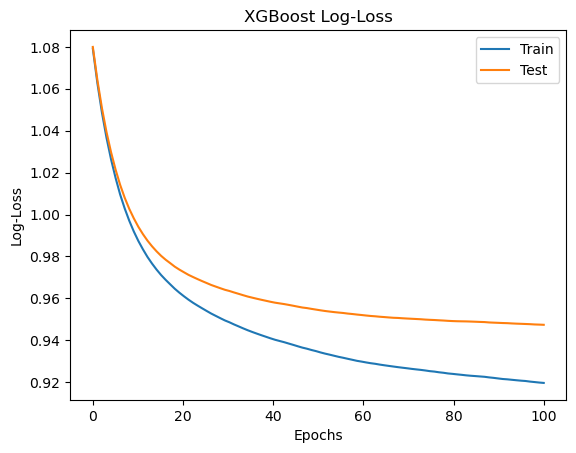

In [13]:
plt.plot(x_axis, results['validation_0']['mlogloss'], label='Train')
plt.plot(x_axis, results['validation_1']['mlogloss'], label='Test')
plt.legend()
plt.ylabel('Log-Loss')
plt.xlabel('Epochs')
plt.title('XGBoost Log-Loss')
plt.show()

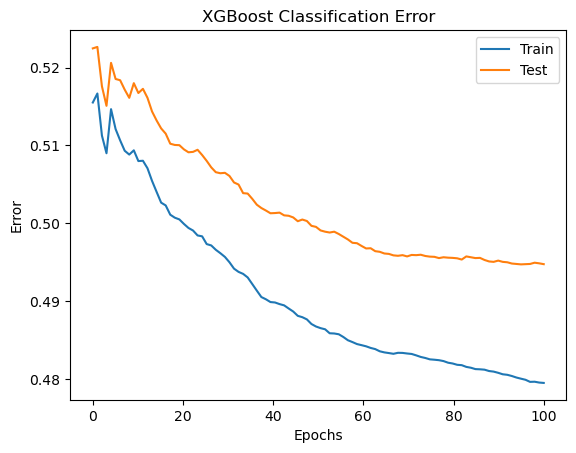

In [14]:
plt.plot(x_axis, results['validation_0']['merror'], label='Train')
plt.plot(x_axis, results['validation_1']['merror'], label='Test')
plt.legend()
plt.ylabel('Error')
plt.xlabel('Epochs')
plt.title('XGBoost Classification Error')
plt.show()

Apply the model and then predict the BDT_scores for each of the classifications

In [ ]:
# Predict class labels
y_pred = clf.predict(features_test)

# Predict class probabilities
y_proba = clf.predict_proba(features_test)

# BDT score for signal (numubarCC = class 2)
bdt_score_numubarcc = y_proba[:, 2]  # probability for class=2

# Optional: print a quick check of predicted classes
unique, counts = np.unique(y_pred, return_counts=True)
print("Predicted class distribution:", dict(zip(unique, counts)))

Predicted class distribution: {0: 12093, 1: 14845, 2: 10234}


Plot the Confusion matrix

Test Accuracy: 0.5052


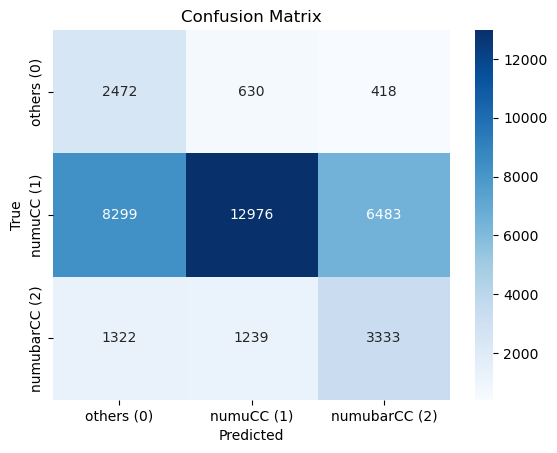

In [16]:
# Accuracy
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(targets_test, y_pred)
print(f"Test Accuracy: {accuracy:.4f}")

# Confusion matrix
cm = confusion_matrix(targets_test, y_pred)

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['others (0)', 'numuCC (1)', 'numubarCC (2)'],
            yticklabels=['others (0)', 'numuCC (1)', 'numubarCC (2)'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


Extracting and Plotting ROC curve

In [17]:
# from sklearn import metrics
# def buildROC(target_test, test_preds, target_train, train_preds):
#     fpr_test, tpr_test, _ = metrics.roc_curve(target_test, test_preds)
#     fpr_train, tpr_train, _ = metrics.roc_curve(target_train, train_preds)
#     roc_auc_test = metrics.auc(fpr_test, tpr_test)
#     roc_auc_train = metrics.auc(fpr_train, tpr_train)
#     plt.title('Receiver Operating Characteristic')
#     plt.plot(fpr_test, tpr_test, label = 'Test - AUC = %0.2f' % roc_auc_test, color='g')
#     plt.plot(fpr_train, tpr_train, label = 'Train - AUC = %0.2f' % roc_auc_train, color='b')
#     plt.legend(loc = 'lower right')
#     plt.plot([0, 1], [0, 1],'r--')
#     plt.ylabel('True Positive Rate')
#     plt.xlabel('False Positive Rate')

In [18]:
# y_pred_proba_train = clf.predict_proba(features_train)
# y_pred_proba_test = clf.predict_proba(features_test)

In [19]:
# buildROC(targets_test, y_pred_proba_test[:, 1], targets_train, y_pred_proba_train[:, 1])

Feature Importance

In [20]:
def plot_important_features(features, feature_importances_, number):
    
    plt.close()
    plt.figure(figsize=(8,5))
    
    zipped = zip(features, feature_importances_)
    zipped_sort = sorted(zipped, key = lambda x:x[1], reverse=True)
    zipped_sort_reduced = zipped_sort[:number]
    
    res = [[ i for i, j in zipped_sort_reduced], 
           [ j for i, j in zipped_sort_reduced]]
    red_features = res[0]
    red_importances = res[1]
    
    plt.barh(range(len(red_importances)), red_importances, align='center')
    plt.yticks(np.arange(len(red_features)), red_features)
    plt.xlabel("Feature importance")
    plt.ylabel("Top %i features"%(number))
    plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.1)
    plt.tight_layout()
    plt.show()
    
    return red_features

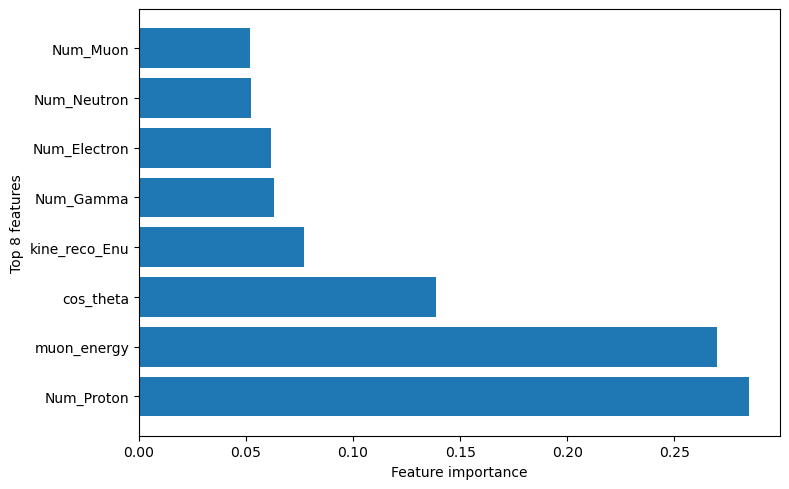

In [21]:
list_features = plot_important_features(training_variables, clf.feature_importances_, 8)

Plot the BDT Score Distribution

[0.3369789  0.21159491 0.10370167 ... 0.73669857 0.06156527 0.48010144]
[0.24028176 0.26368612 0.5927172  ... 0.17858133 0.14959103 0.16351396]
[0.42273936 0.52471894 0.30358118 ... 0.08472015 0.7888437  0.35638463]


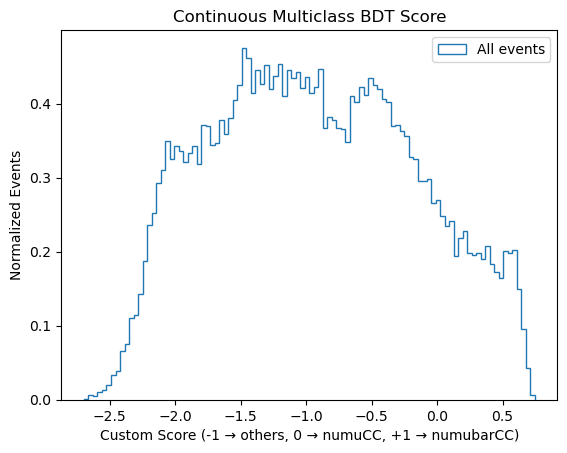

In [64]:
P0 = y_proba[:,0]  # others
P1 = y_proba[:,1]  # numuCC
P2 = y_proba[:,2]  # numubarCC

print(P0)
print(P1)
print(P2)

# Compute custom continuous score
score = -3*P0 - P1 + P2  # Custom score: -3 → others, -1 → numuCC, +1 → numubarCC; score = -3 * P0 - 1 * P1 + 1 * P2

# Plot the distribution of the custom score
plt.hist(score, bins=100, density=True, histtype='step', label='All events')
plt.xlabel('Custom Score (-1 → others, 0 → numuCC, +1 → numubarCC)')
plt.ylabel('Normalized Events')
plt.title('Continuous Multiclass BDT Score')
plt.legend()
plt.show()


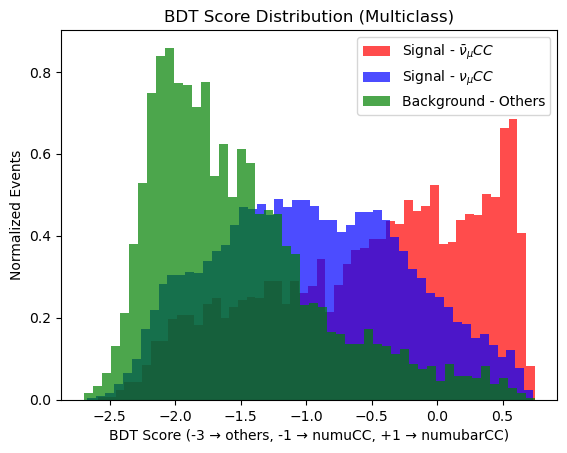

In [95]:
plt.hist(score[targets_test==2], bins=50, alpha=0.7, label=r'Signal - $\bar{\nu}_{\mu}CC$', color='red', density=True)
plt.hist(score[targets_test==1], bins=50, alpha=0.7, label=r'Signal - $\nu_{\mu}CC$', color='blue', density=True)
plt.hist(score[targets_test==0], bins=50, alpha=0.7, label='Background - Others', color='green', density=True)

plt.xlabel('BDT Score (-3 → others, -1 → numuCC, +1 → numubarCC)')
plt.ylabel('Normalized Events')
plt.title('BDT Score Distribution (Multiclass)')
plt.legend()
plt.show()

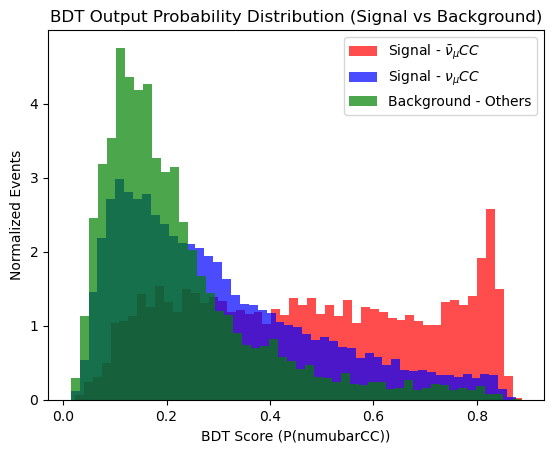

In [66]:
plt.hist(bdt_score_numubarcc[targets_test == 2], bins=50, alpha=0.7, label=r'Signal - $\bar{\nu}_{\mu}CC$', color='red', density=True)
plt.hist(bdt_score_numubarcc[targets_test == 1], bins=50, alpha=0.7, label=r'Signal - $\nu_{\mu}CC$', color='blue', density=True)
plt.hist(bdt_score_numubarcc[targets_test == 0], bins=50, alpha=0.7, label='Background - Others', color='green', density=True)
plt.xlabel('BDT Score (P(numubarCC))')
plt.ylabel('Normalized Events')
plt.title('BDT Output Probability Distribution (Signal vs Background)')
plt.legend()
plt.show()

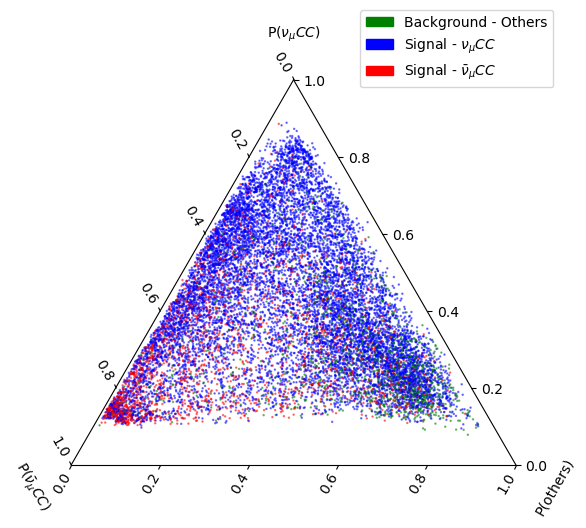

In [67]:
# Subsample the data (e.g., 30% of the data)
sample_size = int(0.4 * len(P1))  # Adjust 0.3 to the percentage you want
random_indices = np.random.choice(len(P1), size=sample_size, replace=False)

# Get the subsampled data
P1_subsample = np.array(P1)[random_indices]
P2_subsample = np.array(P2)[random_indices]
P0_subsample = np.array(P0)[random_indices]
targets_test_subsample = np.array(targets_test)[random_indices]

# Color mapping by class
color_map = {0: 'green', 1: 'blue', 2: 'red'}
label_map = {0: 'Background - Others', 1: r'Signal - $\nu_{\mu}CC$', 2: r'Signal - $\bar{\nu}_{\mu}CC$'}
colors = [color_map[label] for label in targets_test_subsample]

# Plot
fig = plt.figure(figsize=(6, 5))
ax = fig.add_subplot(1, 1, 1, projection='ternary')
sc = ax.scatter(P1_subsample, P2_subsample, P0_subsample, c=colors, alpha=0.5, s=0.6)

# Labels on triangle sides
ax.set_tlabel(r'P($\nu_{\mu}CC$)')
ax.set_llabel(r'P($\bar{\nu}_{\mu}CC$)')
ax.set_rlabel('P(others)')

# Legend
handles = [mpatches.Patch(color=clr, label=label_map[key]) for key, clr in color_map.items()]
plt.legend(handles=handles, loc='upper right', bbox_to_anchor=(1.1, 1.2))

plt.show()


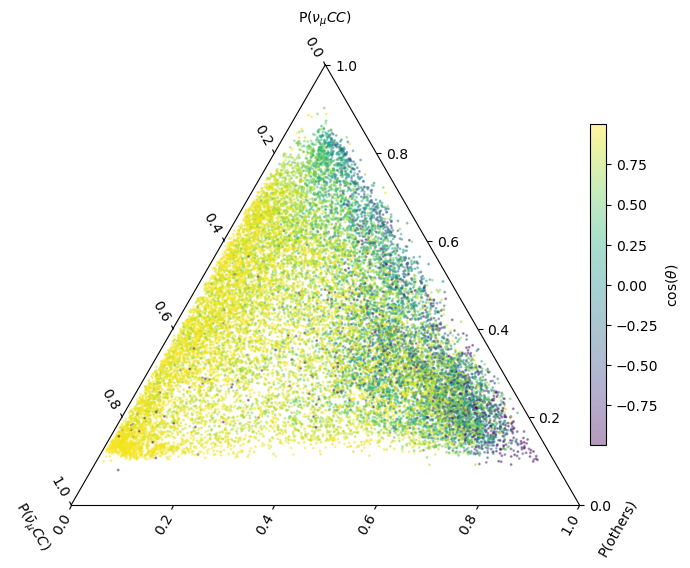

In [68]:
# Suppose cos_theta is your array of cos(theta) values (same length as P1, P2, P0)
# For example:
# cos_theta = np.array([...])  # your data here

# Subsample if needed (optional, but as before)
sample_size = int(0.5 * len(P1))
random_indices = np.random.choice(len(P1), size=sample_size, replace=False)

P1_subsample = np.array(P1)[random_indices]
P2_subsample = np.array(P2)[random_indices]
P0_subsample = np.array(P0)[random_indices]
cos_theta_subsample = np.array(features_test["cos_theta"])[random_indices]

# Plot
fig = plt.figure(figsize=(7, 6))
ax = fig.add_subplot(1, 1, 1, projection='ternary')

# Scatter with continuous coloring based on cos(theta)
sc = ax.scatter(P1_subsample, P2_subsample, P0_subsample,
                c=cos_theta_subsample, cmap='viridis',  # you can change cmap here
                alpha=0.4, s=1.2)

# Labels on triangle sides
ax.set_tlabel(r'P($\nu_{\mu}CC$)')
ax.set_llabel(r'P($\bar{\nu}_{\mu}CC$)')
ax.set_rlabel('P(others)')

# Add color bar
cbar = fig.colorbar(sc, ax=ax, fraction=0.03, pad=0.02)
cbar.set_label(r'$\cos(\theta)$')

plt.tight_layout()
plt.show()


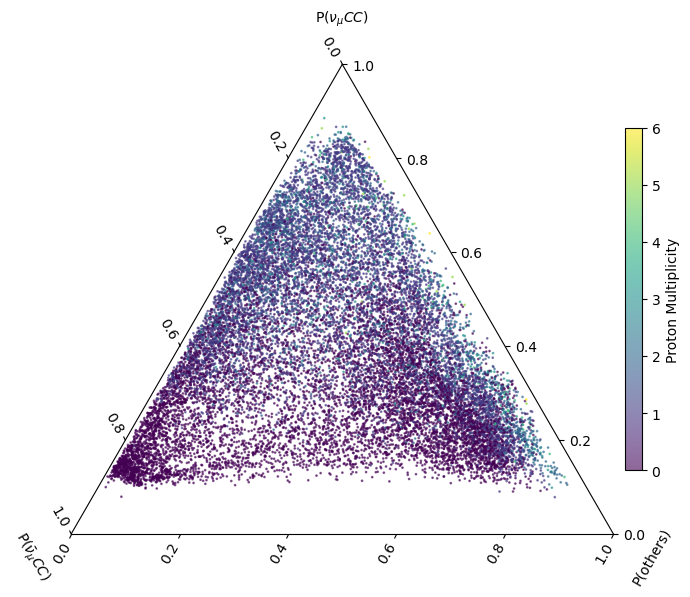

In [71]:
# Suppose cos_theta is your array of cos(theta) values (same length as P1, P2, P0)
# For example:
# cos_theta = np.array([...])  # your data here

# Subsample if needed (optional, but as before)
sample_size = int(0.5 * len(P1))
random_indices = np.random.choice(len(P1), size=sample_size, replace=False)

P1_subsample = np.array(P1)[random_indices]
P2_subsample = np.array(P2)[random_indices]
P0_subsample = np.array(P0)[random_indices]
num_proton_subsample = np.array(features_test["Num_Proton"])[random_indices]

# Plot
fig = plt.figure(figsize=(7, 6))
ax = fig.add_subplot(1, 1, 1, projection='ternary')

# Scatter with continuous coloring based on cos(theta)
sc = ax.scatter(P1_subsample, P2_subsample, P0_subsample,
                c=num_proton_subsample, cmap='viridis',  # you can change cmap here
                alpha=0.6, s=0.9)

# Labels on triangle sides
ax.set_tlabel(r'P($\nu_{\mu}CC$)')
ax.set_llabel(r'P($\bar{\nu}_{\mu}CC$)')
ax.set_rlabel('P(others)')

# Add color bar
cbar = fig.colorbar(sc, ax=ax, fraction=0.03, pad=0.02)
cbar.set_label("Proton Multiplicity")

plt.tight_layout()
plt.show()


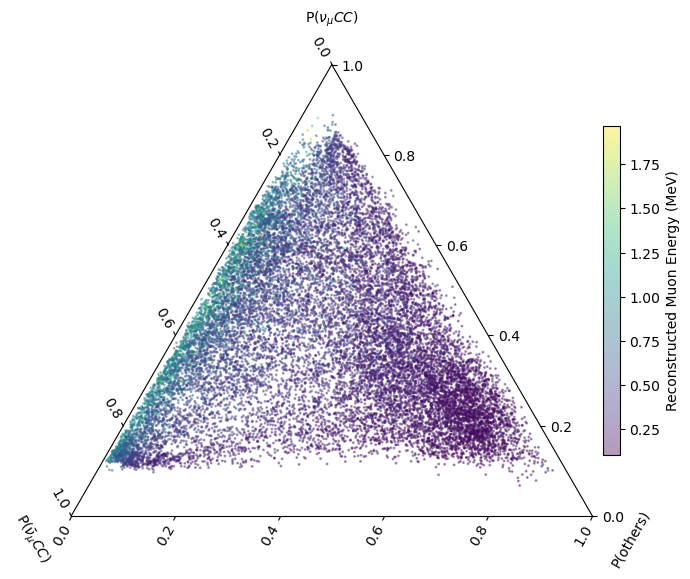

In [ ]:
# Subsample if needed (optional, but as before)
sample_size = int(0.5 * len(P1))
random_indices = np.random.choice(len(P1), size=sample_size, replace=False)

P1_subsample = np.array(P1)[random_indices]
P2_subsample = np.array(P2)[random_indices]
P0_subsample = np.array(P0)[random_indices]
mu_energy_subsample = np.array(features_test["muon_energy"])[random_indices]

# Plot
fig = plt.figure(figsize=(7, 6))
ax = fig.add_subplot(1, 1, 1, projection='ternary')

# Scatter with continuous coloring based on cos(theta)
sc = ax.scatter(P1_subsample, P2_subsample, P0_subsample,
                c=mu_energy_subsample, cmap='viridis',  # you can change cmap here
                alpha=0.4, s=1.2)

# Labels on triangle sides
ax.set_tlabel(r'P($\nu_{\mu}CC$)')
ax.set_llabel(r'P($\bar{\nu}_{\mu}CC$)')
ax.set_rlabel('P(others)')

# Add color bar
cbar = fig.colorbar(sc, ax=ax, fraction=0.03, pad=0.02)
cbar.set_label("Reconstructed Muon Energy (MeV)")

plt.tight_layout()
plt.show()

# Plotting ROC Curves (each class vs rest)

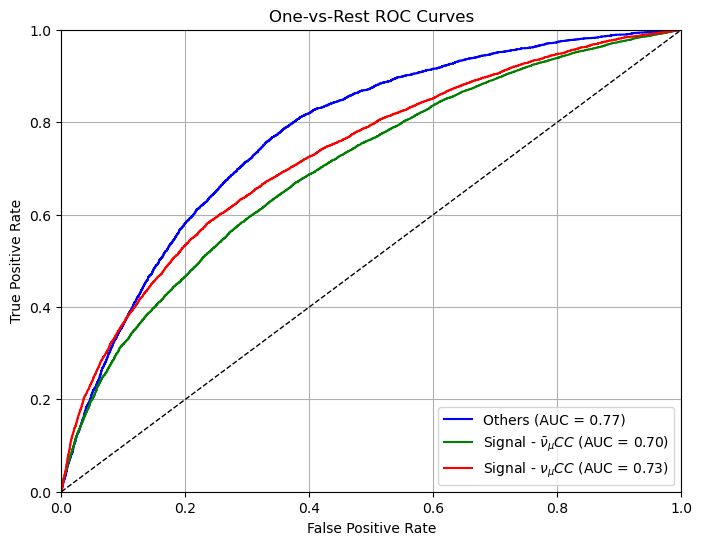

In [29]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt

# Assume targets_test and y_proba from your test set
# targets_test ∈ {0,1,2}
# y_proba.shape = (n_samples, 3)

# Binarize the true labels for multiclass ROC
targets_test_bin = label_binarize(targets_test, classes=[0,1,2])  # shape (n_samples, 3)

# Compute ROC curve and AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
n_classes = 3

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(targets_test_bin[:, i], y_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(8,6))
colors = ['blue', 'green', 'red']
labels = ['Others', r'Signal - $\bar{\nu}_{\mu}CC$', r'Signal - $\nu_{\mu}CC$']

for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], color=colors[i],
             label=f'{labels[i]} (AUC = {roc_auc[i]:0.2f})')

plt.plot([0,1], [0,1], 'k--', lw=1)
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('One-vs-Rest ROC Curves')
plt.legend(loc="lower right")
plt.grid()
plt.show()


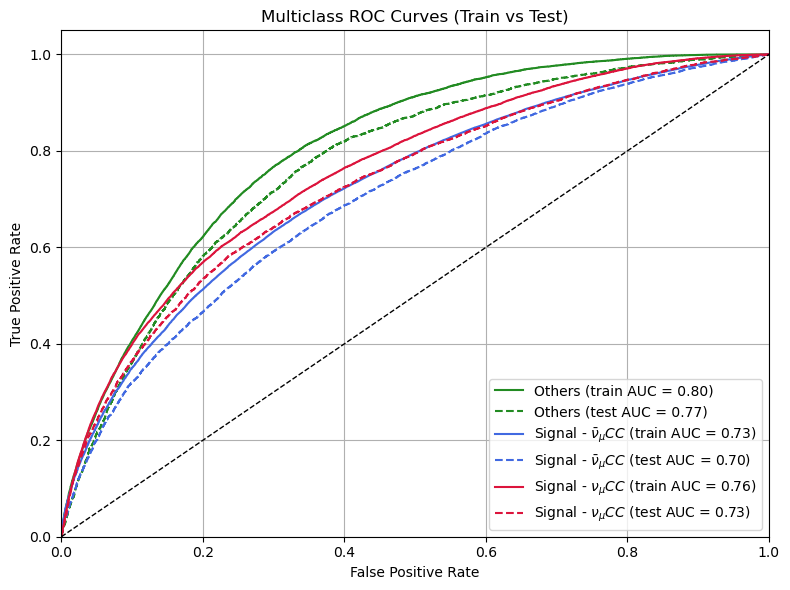

In [30]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt

# ---- Predict probabilities ----
y_proba_train = clf.predict_proba(features_train)  # shape (n_train, 3)
y_proba_test = clf.predict_proba(features_test)    # shape (n_test, 3)

# ---- Binarize targets ----
classes = [0, 1, 2]  # others, numuCC, numubarCC
targets_train_bin = label_binarize(targets_train, classes=classes)
targets_test_bin  = label_binarize(targets_test, classes=classes)

# ---- Compute ROC + AUC for train/test, per class ----
fpr_train, tpr_train, auc_train = {}, {}, {}
fpr_test, tpr_test, auc_test = {}, {}, {}
n_classes = len(classes)

for i in range(n_classes):
    fpr_train[i], tpr_train[i], _ = roc_curve(targets_train_bin[:, i], y_proba_train[:, i])
    auc_train[i] = auc(fpr_train[i], tpr_train[i])
    
    fpr_test[i], tpr_test[i], _ = roc_curve(targets_test_bin[:, i], y_proba_test[:, i])
    auc_test[i] = auc(fpr_test[i], tpr_test[i])

# ---- Plot ----
plt.figure(figsize=(8,6))
colors = ['forestgreen', 'royalblue', 'crimson']
labels = ['Others', r'Signal - $\bar{\nu}_{\mu}CC$', r'Signal - $\nu_{\mu}CC$']

for i in range(n_classes):
    plt.plot(fpr_train[i], tpr_train[i], color=colors[i], linestyle='-', 
             label=f'{labels[i]} (train AUC = {auc_train[i]:.2f})')
    plt.plot(fpr_test[i], tpr_test[i], color=colors[i], linestyle='--', 
             label=f'{labels[i]} (test AUC = {auc_test[i]:.2f})')

plt.plot([0,1], [0,1], 'k--', lw=1)
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multiclass ROC Curves (Train vs Test)')
plt.legend(loc="lower right")
plt.grid()
plt.tight_layout()
plt.show()


In [31]:
# # First Calulate BDT score
# #df_bdt.loc[:,bdt_score] = clf.predict_proba(df_bdt[training_variables])[:,1]
# df_bdt['bdt_score'] = clf.predict_proba(df_bdt[training_variables])[:,1]

# y_pred_proba_sig_train = clf.predict_proba(features_test_sig)
# y_pred_proba_bkg_train = clf.predict_proba(features_test_bkg)
# bdtScoreSigTrain = y_pred_proba_sig_train[:,-1]
# bdtScoreBkgTrain = y_pred_proba_bkg_train[:,-1]

In [32]:
# plt.hist(bdtScoreSigTrain, 25, color='orange', range=(0.,1.), label=r'Signal - $\bar{\nu}_{\mu}CC$', alpha=0.5, density=False)
# plt.hist(bdtScoreBkgTrain, 25, color='green', range=(0.,1.), label= r'Background - $\nu_{\mu}CC$ and Others', alpha=0.5, density=False)

# plt.xlabel("BDT Prediction Score")
# plt.ylabel("Entries")
# plt.legend(fontsize=8, loc='best', frameon=False)
# plt.show()

In [33]:
# cut = 0.76
# signal_cut = bdtScoreSigTrain[bdtScoreSigTrain>=cut]
# bkg_cut = bdtScoreBkgTrain[bdtScoreBkgTrain>=cut]

# signal_cut_accuracy = signal_cut.size/(signal_cut.size+bkg_cut.size)
# bkg_cut_accuracy = bkg_cut.size/(signal_cut.size+bkg_cut.size)
# print("the sig accuracy %.3f and bkg accuracy is %.3f" % (signal_cut_accuracy, bkg_cut_accuracy))
# print(signal_cut.size)
# print(bkg_cut.size)
# print(bdtScoreSigTrain.size)

In [34]:
# plot signal and background separately
# plt.figure();
# plt.hist(predictions[test.get_label().astype(bool)],bins=np.linspace(0,1,50),
#          histtype='step',color='midnightblue',label='signal');
# plt.hist(predictions[~(test.get_label().astype(bool))],bins=np.linspace(0,1,50),
#          histtype='step',color='firebrick',label='background');
# # make the plot readable
# plt.xlabel('Prediction from BDT',fontsize=12);
# plt.ylabel('Events',fontsize=12);
# plt.legend(frameon=False);

Plot the confusion matrix

In [35]:
# mc_y_pred = clf.predict(features_test)

# group_names = ['True Negative', 'False Positive', 'False Negative', 'True Positive']
# cm_mc = confusion_matrix(targets_test, mc_y_pred)
# test_counts = ["{0:0.0f}".format(value) for value in cm_mc.flatten()]
# test_percentage = ["{0:.2%}".format(value) for value in cm_mc.flatten()/np.sum(cm_mc)]
# test_labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names,test_counts,test_percentage)]
# test_labels = np.asarray(test_labels).reshape(2,2)
# ax= plt.subplot()
# sns.heatmap(cm_mc, annot=test_labels, fmt='', cmap='Blues', ax=ax);
# tn, fp, fn, tp = cm_mc.ravel()
# print(tn, fp, fn, tp)
# # labels, title and ticks

# ax.set_title('BDT Model Confusion Matrix'); 
# ax.set_xlabel("Predicted Label")
# ax.set_ylabel("True Label")
# ax.xaxis.set_ticklabels(['Negative', 'Positive']); 
# ax.yaxis.set_ticklabels(['Negative', 'Positive']);

## Plotting Particle Multiplicity

In [36]:
# First set a mask for plotting multiplicity
df_numucc = df_bdt.query('bdt_multi_label==1')
df_numubar = df_bdt.query('bdt_multi_label==2')
df_others = df_bdt.query('bdt_multi_label==0')

In [37]:
df_bdt.head()

,kine_reco_Enu,kine_pio_mass,kine_pio_flag,kine_pio_vtx_dis,kine_pio_energy_1,kine_pio_energy_2,kine_pio_dis_1,kine_pio_dis_2,kine_pio_angle,numu_cc_flag,...,Num_Kaon,Num_Proton,Num_Gamma,Num_Electron,Num_Pion,RSE,bdt_numubarcc_label,bdt_numucc_label,bdt_others_label,bdt_multi_label
0,519.828857,40.981392,1,108.913315,36.602570,14.000175,0.000000,82.167252,158.470398,1.0,...,0.0,0.0,4.0,1.0,0.0,14121_122_6119,1,0,0,2
5,179.307251,0.000000,0,1000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,...,0.0,0.0,2.0,2.0,0.0,14121_215_10756,0,0,1,0
8,1554.589478,97.067871,1,0.000000,5.853202,592.542969,34.231270,250.054977,110.998123,1.0,...,0.0,1.0,4.0,0.0,0.0,14121_215_10795,1,0,0,2
10,598.605408,4.930235,1,0.000000,45.465714,69.135605,190.499268,199.879242,5.040080,1.0,...,0.0,0.0,2.0,1.0,0.0,14121_223_11152,1,0,0,2
12,408.178436,0.000000,0,1000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,...,0.0,0.0,2.0,0.0,0.0,14121_223_11167,0,1,0,1


/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/3049517114.py:1: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(df_numucc['Num_Proton'], 6, (0,6), density=True, label=r'$\nu_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='blue',hatch='\\\\\\\\')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/3049517114.py:2: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(df_numubar['Num_Proton'], 6, (0,6), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='maroon',hatch='////')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/3049517114.py:3: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9;

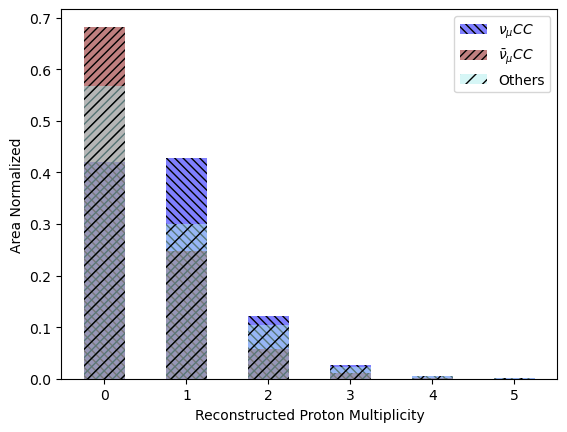

In [38]:
plt.hist(df_numucc['Num_Proton'], 6, (0,6), density=True, label=r'$\nu_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='blue',hatch='\\\\\\\\')
plt.hist(df_numubar['Num_Proton'], 6, (0,6), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='maroon',hatch='////')
plt.hist(df_others['Num_Proton'], 6, (0,6), density=True, label= r'Others', align='left', rwidth=0.5, alpha=.5, color='paleturquoise',hatch='//')
plt.xlabel("Reconstructed Proton Multiplicity")
plt.ylabel("Area Normalized")
plt.legend()
plt.show()

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/279634887.py:1: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(df_numucc['Num_Gamma'], 6, (0,6), density=True, label=r'$\nu_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='blue',hatch='\\\\\\\\')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/279634887.py:2: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(df_numubar['Num_Gamma'], 6, (0,6), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='maroon',hatch='////')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/279634887.py:3: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the 

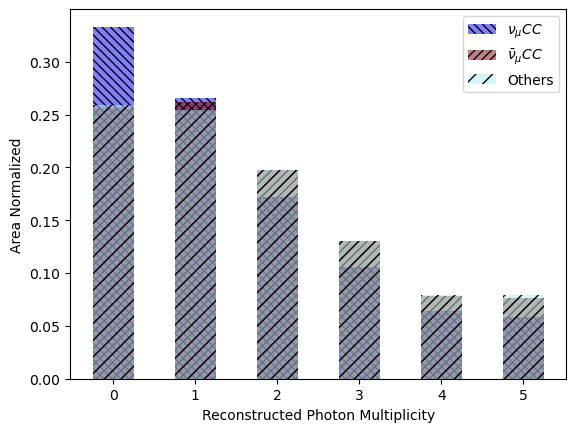

In [39]:
plt.hist(df_numucc['Num_Gamma'], 6, (0,6), density=True, label=r'$\nu_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='blue',hatch='\\\\\\\\')
plt.hist(df_numubar['Num_Gamma'], 6, (0,6), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='maroon',hatch='////')
plt.hist(df_others['Num_Gamma'], 6, (0,6), density=True, label= r'Others', align='left', rwidth=0.5, alpha=.5, color='paleturquoise',hatch='//')
plt.xlabel("Reconstructed Photon Multiplicity")
plt.ylabel("Area Normalized")
plt.legend()
plt.show()

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/327151371.py:1: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(df_numucc['Num_Electron'], 5, (0,5), density=True, label=r'$\nu_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='blue', hatch='\\\\\\\\')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/327151371.py:2: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(df_numubar['Num_Electron'], 5, (0,5), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='maroon', hatch='////')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/327151371.py:3: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3

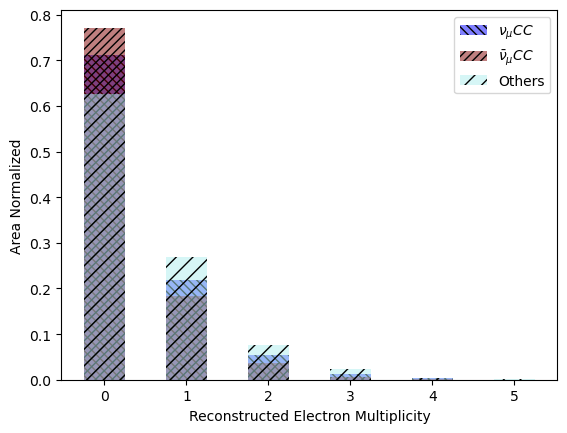

In [40]:
plt.hist(df_numucc['Num_Electron'], 5, (0,5), density=True, label=r'$\nu_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='blue', hatch='\\\\\\\\')
plt.hist(df_numubar['Num_Electron'], 5, (0,5), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='maroon', hatch='////')
plt.hist(df_others['Num_Electron'], 6, (0,6), density=True, label= r'Others', align='left', rwidth=0.5, alpha=.5, color='paleturquoise',hatch='//')
plt.xlabel("Reconstructed Electron Multiplicity")
plt.ylabel("Area Normalized")
plt.legend()
plt.show()

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/1850962600.py:1: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(df_numucc['Num_Muon'], 5, (0,5), density=True, label=r'$\nu_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='blue', hatch='\\\\\\\\')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/1850962600.py:2: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(df_numubar['Num_Muon'], 5, (0,5), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='maroon', hatch='////')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/1850962600.py:3: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; t

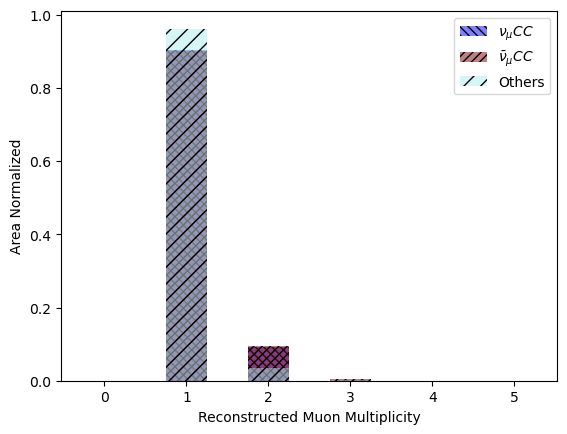

In [41]:
plt.hist(df_numucc['Num_Muon'], 5, (0,5), density=True, label=r'$\nu_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='blue', hatch='\\\\\\\\')
plt.hist(df_numubar['Num_Muon'], 5, (0,5), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='maroon', hatch='////')
plt.hist(df_others['Num_Muon'], 6, (0,6), density=True, label= r'Others', align='left', rwidth=0.5, alpha=.5, color='paleturquoise',hatch='//')
plt.xlabel("Reconstructed Muon Multiplicity")
plt.ylabel("Area Normalized")
plt.legend()
plt.show()

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/1704111924.py:1: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(df_numucc['Num_Neutron'], 5, (0,5), density=True, label=r'$\nu_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='blue', hatch='\\\\\\\\')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/1704111924.py:2: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(df_numubar['Num_Neutron'], 5, (0,5), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='maroon', hatch='////')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/1704111924.py:3: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 

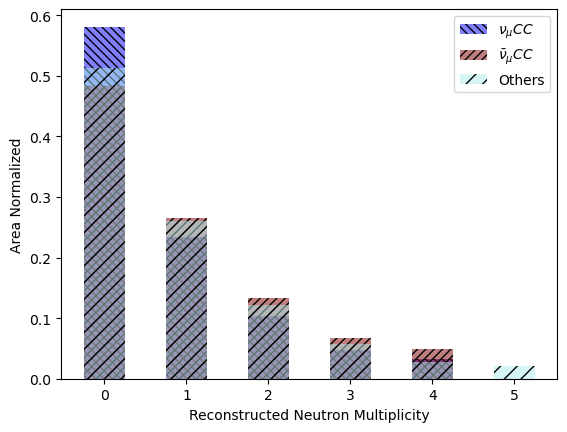

In [42]:
plt.hist(df_numucc['Num_Neutron'], 5, (0,5), density=True, label=r'$\nu_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='blue', hatch='\\\\\\\\')
plt.hist(df_numubar['Num_Neutron'], 5, (0,5), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='maroon', hatch='////')
plt.hist(df_others['Num_Neutron'], 6, (0,6), density=True, label= r'Others', align='left', rwidth=0.5, alpha=.5, color='paleturquoise',hatch='//')
plt.xlabel("Reconstructed Neutron Multiplicity")
plt.ylabel("Area Normalized")
plt.legend()
plt.show()

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/2143412985.py:1: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(df_numucc['Num_Pion'], 6, (0,6), density=True, label=r'$\nu_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='blue', hatch='\\\\\\\\')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/2143412985.py:2: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(df_numubar['Num_Pion'], 6, (0,6), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='maroon', hatch='////')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/2143412985.py:3: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; t

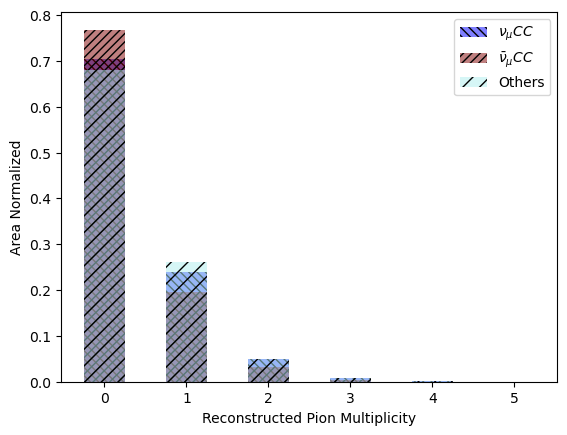

In [43]:
plt.hist(df_numucc['Num_Pion'], 6, (0,6), density=True, label=r'$\nu_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='blue', hatch='\\\\\\\\')
plt.hist(df_numubar['Num_Pion'], 6, (0,6), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='maroon', hatch='////')
plt.hist(df_others['Num_Pion'], 6, (0,6), density=True, label= r'Others', align='left', rwidth=0.5, alpha=.5, color='paleturquoise',hatch='//')
plt.xlabel("Reconstructed Pion Multiplicity")
plt.ylabel("Area Normalized")
plt.legend()
plt.show()

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/3470418256.py:1: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(df_numucc['cos_theta'], 25, (-1,1), density=True, label=r'$\nu_{\mu}CC$', align='left', alpha=.5, color='blue',hatch='\\\\\\\\')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/3470418256.py:2: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(df_numubar['cos_theta'], 25, (-1,1), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', alpha=.5, color='maroon',hatch='////')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/3470418256.py:3: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will be

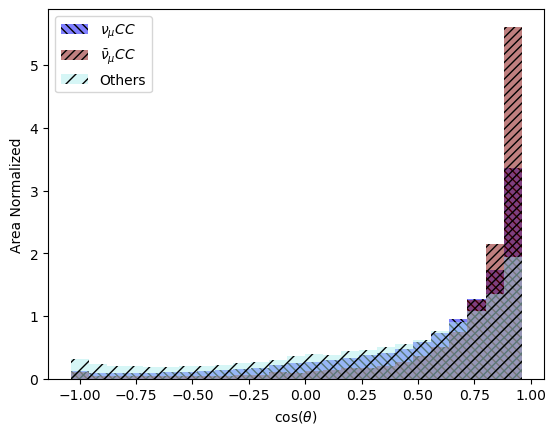

In [44]:
plt.hist(df_numucc['cos_theta'], 25, (-1,1), density=True, label=r'$\nu_{\mu}CC$', align='left', alpha=.5, color='blue',hatch='\\\\\\\\')
plt.hist(df_numubar['cos_theta'], 25, (-1,1), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', alpha=.5, color='maroon',hatch='////')
plt.hist(df_others['cos_theta'], 25, (-1,1), density=True, label= r'Others', align='left', alpha=.5, color='paleturquoise',hatch='//')
plt.xlabel(r"cos($\theta$)")
plt.ylabel("Area Normalized")
plt.legend()
plt.show()

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/578185803.py:1: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(df_numucc['muon_energy']*1000, 25, (0.,2000.), density=True, label=r'$\nu_{\mu}CC$', align='left', alpha=.5, color='blue',hatch='\\\\\\\\')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/578185803.py:2: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(df_numubar['muon_energy']*1000, 25, (0.,2000.), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', alpha=.5, color='maroon',hatch='////')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/578185803.py:3: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; th

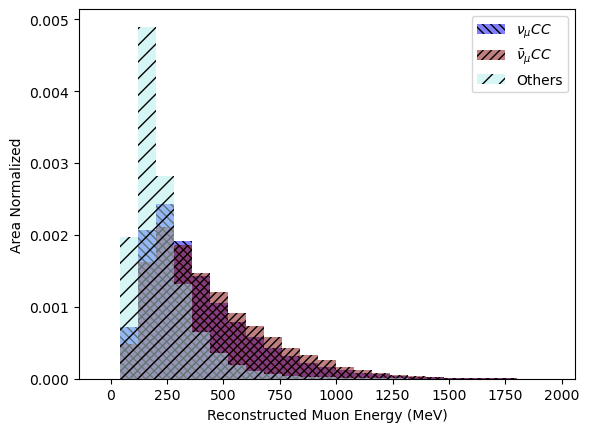

In [45]:
plt.hist(df_numucc['muon_energy']*1000, 25, (0.,2000.), density=True, label=r'$\nu_{\mu}CC$', align='left', alpha=.5, color='blue',hatch='\\\\\\\\')
plt.hist(df_numubar['muon_energy']*1000, 25, (0.,2000.), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', alpha=.5, color='maroon',hatch='////')
plt.hist(df_others['muon_energy']*1000, 25, (0.,2000.), density=True, label= r'Others', align='left', alpha=.5, color='paleturquoise',hatch='//')
plt.xlabel("Reconstructed Muon Energy (MeV)")
plt.ylabel("Area Normalized")
plt.legend()
plt.show()

## Plotting Proton Multiplicity and Scattering Angle Distribution

For numuCC label

In [46]:
fig = px.density_heatmap(df_numucc, x="cos_theta", y="Num_Proton", text_auto=False,
                         labels={"Num_Proton": "Proton Multiplicity", "cos_theta": "cos (theta)"},
                         marginal_x="histogram", marginal_y="histogram", title="numuCC proton multiplicity vs scattering angle",
                         range_x=(0.2,1.02), range_y=(-.2,3.), nbinsx=100, nbinsy=15)
fig.show()

In [47]:
fig = px.density_heatmap(df_numubar, x="cos_theta", y="Num_Proton", text_auto=False, 
                         labels={"Num_Proton": "Proton Multiplicity", "cos_theta": "cos(theta)"},
                         marginal_x="histogram", marginal_y="histogram", title="numubarCC proton multiplicity vs scattering angle",
                         range_x=(0.4,1.02), range_y=(-0.5,3.), nbinsx=75, nbinsy=10)
fig.show()

### **Applying the MC-trained BDT onto other samples (specifically data)**

In [72]:
# # use our model prediction on all the other samples
# df_mc4.loc[:,'bdt_score'] = clf.predict_proba(df_mc4[training_variables])[:,1]
# df_ext.loc[:,'bdt_score'] = clf.predict_proba(df_ext[training_variables])[:,1]
# df_dirt.loc[:,'bdt_score'] = clf.predict_proba(df_dirt[training_variables])[:,1]
# df_beam_on.loc[:,'bdt_score'] = clf.predict_proba(df_beam_on[training_variables])[:,1]

# use our model prediction on all the other samples (custom score: -P0 + P2)
df_mc4.loc[:,'bdt_score'] = -3*clf.predict_proba(df_mc4[training_variables])[:,0] - clf.predict_proba(df_mc4[training_variables])[:,1] + clf.predict_proba(df_mc4[training_variables])[:,2]
df_ext.loc[:,'bdt_score'] = -3*clf.predict_proba(df_ext[training_variables])[:,0] - clf.predict_proba(df_ext[training_variables])[:,1] + clf.predict_proba(df_ext[training_variables])[:,2]
df_dirt.loc[:,'bdt_score'] = -3*clf.predict_proba(df_dirt[training_variables])[:,0] - clf.predict_proba(df_dirt[training_variables])[:,1] + clf.predict_proba(df_dirt[training_variables])[:,2]
df_beam_on.loc[:,'bdt_score'] = -3*clf.predict_proba(df_beam_on[training_variables])[:,0] - clf.predict_proba(df_beam_on[training_variables])[:,1] + clf.predict_proba(df_beam_on[training_variables])[:,2]


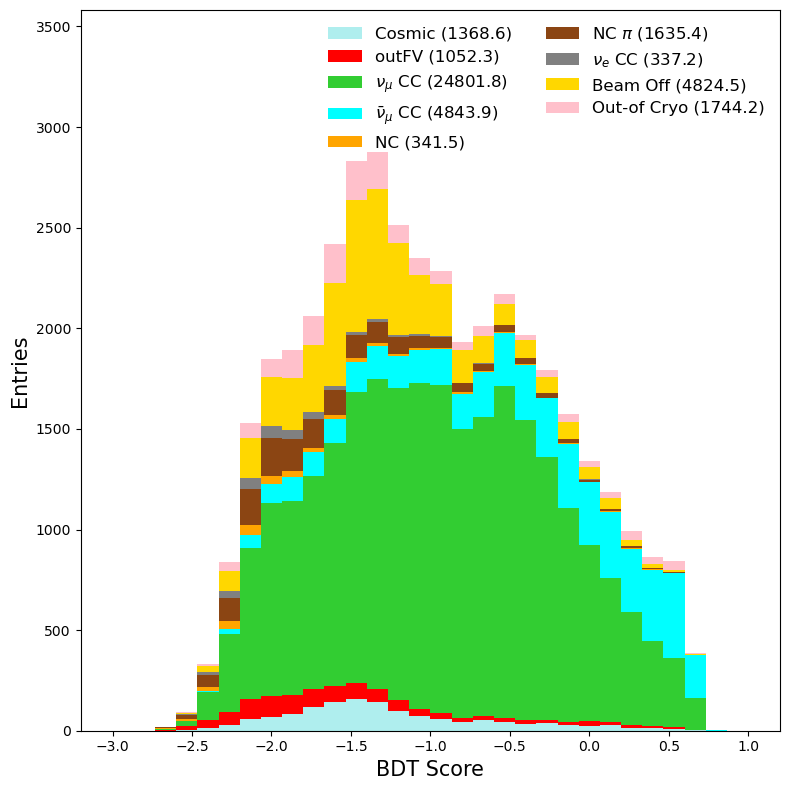

In [74]:
mc_data_stacked_hist(df_beam_on, df_ext, df_mc4, df_dirt, 'bdt_score', 'weight_ubtune', \
                        "plots/%s_bdt_score" % "bdtScore", r"BDT Score",\
                        -3., 1., 30, pot_data=run3b_pot_beam_on)

### **For our BDT model, plot out the efficiency and purity of our signal**

In [50]:
from scipy.interpolate import interp1d
from scipy.optimize import fsolve

In [93]:
def plot_eff_purity(df, sig_label):
    step = .01 

    bdt_var_min = -3.
    bdt_var_max = 0.69

    # create the efficiency, purity and both arrays
    h_eff = []
    h_eff_x = []
    h_pur = []
    h_pur_x = []
    h_multi = [] 
    h_multi_x = []

    # loop over bdt var, from 0 to 1 in steps 
    var = bdt_var_min
    while(var <= bdt_var_max):

        # calculate BDT model efficiency
        if(sig_label=="numubar"):
            df_eff_num = df[(df.truth_nuPdg==-14) &
                            (df.truth_isCC==1) &
                            (df.truth_vtxInside==1) &
                            (df.bdt_score>var)]
            
            df_eff_den = df[(df.truth_nuPdg==-14) &
                            (df.truth_isCC==1) &
                            (df.truth_vtxInside==1)]
            
        elif(sig_label=="numu"):
            df_eff_num = df[(df.truth_nuPdg==14) &
                            (df.truth_isCC==1) &
                            (df.truth_vtxInside==1) &
                            (df.bdt_score>var)]
            
            df_eff_den = df[(df.truth_nuPdg==14) &
                            (df.truth_isCC==1) &
                            (df.truth_vtxInside==1)]
            
        elif(sig_label=="others"):
            df_eff_num = df[(df.truth_nuPdg!=14) &
                            (df.truth_nuPdg!=-14) &
                            (df.truth_isCC==1) &
                            (df.truth_vtxInside==1) &
                            (df.bdt_score>var)]
            
            df_eff_den = df[(df.truth_nuPdg!=14) &
                            (df.truth_nuPdg!=-14) &
                            (df.truth_isCC==1) &
                            (df.truth_vtxInside==1) &
                            (df.truth_vtxInside==1)]

            
        df_eff_num = gen_nu_selec(df_eff_num)
        
        if(len(df_eff_den)!=0):
            h_eff.append((len(df_eff_num)/len(df_eff_den)))
            h_eff_x.append(var)

        # find which bdt score point does efficiency drops to zero
        closest_x = min(h_eff_x, key=lambda x: abs(0 - h_eff[h_eff_x.index(x)]))
        x_filter_range = (0, closest_x)
        
        # Now calculate purity
        if(sig_label=="numubar"):
            df_pur_num = df[(df.truth_nuPdg==-14) &
                            (df.truth_isCC==1) &
                            (df.truth_vtxInside==1) &
                            (df.bdt_score>var)]
            
        elif(sig_label=="numu"):
            df_pur_num = df[(df.truth_nuPdg==14) &
                            (df.truth_isCC==1) &
                            (df.truth_vtxInside==1) &
                            (df.bdt_score>var)]
            
        elif(sig_label=="others"):
            df_pur_num = df[(df.truth_nuPdg!=14) &
                            (df.truth_nuPdg!=-14) &
                            (df.truth_isCC==1) &
                            (df.truth_vtxInside==1) &
                            (df.bdt_score>var)]


        df_pur_den = df[df.bdt_score>var]

        if(len(df_pur_den)!=0):
            h_pur.append((len(df_pur_num)/len(df_pur_den)))
            h_pur_x.append(var)

        # Finally, calculate purity times efficiency
           
        # purity = -999
        # efficiency = -999

        if(len(df_pur_den)!=0):
            purity = len(df_pur_num)/len(df_pur_den)
        if(len(df_eff_den)!=0):
            efficiency = len(df_pur_num)/len(df_eff_den)

        if((purity!=-999) & (efficiency!=-999)):
            h_multi.append((purity*efficiency))
            h_multi_x.append(var)

        # update to next step
        var += step

    closest_x = min(h_eff_x, key=lambda x: abs(0 - h_eff[h_eff_x.index(x)]))
    x_filter_range = (0, closest_x)
    # filtered_x_pur = [x for x in h_pur_x if x_filter_range[0] <= x <= x_filter_range[1]]
    # filtered_y_pur = [h_pur[h_pur_x.index(x)] for x in filtered_x_pur]
    
    #find the intersection 
    # Interpolate the data
    f1 = interp1d(h_eff_x, h_eff, kind='linear', fill_value='extrapolate')
    f2 = interp1d(h_pur_x, h_pur, kind='linear', fill_value='extrapolate')

    # Define the function representing the difference between the two interpolated functions
    def equation_to_solve(x):
        return f1(x) - f2(x)

    # Guess initial intersection points based on the input data range
    initial_guess = np.linspace(min(min(h_eff_x), min(h_pur_x)), max(max(h_eff_x), max(h_pur_x)), 10)


    # Use fsolve to find the roots (intersection points)
    intersection_points = fsolve(equation_to_solve, initial_guess)

    # plotting section
    plt.plot(h_eff_x, h_eff, c="green", label="Efficiency")
    plt.plot(h_pur_x, h_pur, c="purple", label="Purity")
    plt.plot(h_multi_x, h_multi, ls="-.", c="red", label=r"Eff. $\times$ Pur.")
    # plt.scatter(intersection_points, f1(intersection_points), color='red')
    # plt.vlines(intersection_points[0], 0., 100., colors="blue", ls="--", label=("Optimal BDT Score Cut - %.3f" % intersection_points[0]))
    plt.xlim([-3,1.])
    plt.ylim([0,1.1])

    if(sig_label=="numubar"): plt.title(r"BDT Model $\bar{\nu}_{\mu}$ Selection Efficiency & Purity Across BDT Score Thresholds")
    elif(sig_label=="numu"): plt.title(r"BDT Model $\nu_{\mu}$ Selection Efficiency & Purity Across BDT Score Thresholds")
    elif(sig_label=="others"): plt.title(r"BDT Model Background Selection Efficiency & Purity Across BDT Score Thresholds")
    
    plt.xlabel("BDT Score")
    plt.ylabel(r"Density")
    plt.legend(loc="best")
    plt.tight_layout()
    plt.show()

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/2556392371.py:127: RuntimeWarning:

The iteration is not making good progress, as measured by the 
 improvement from the last ten iterations.



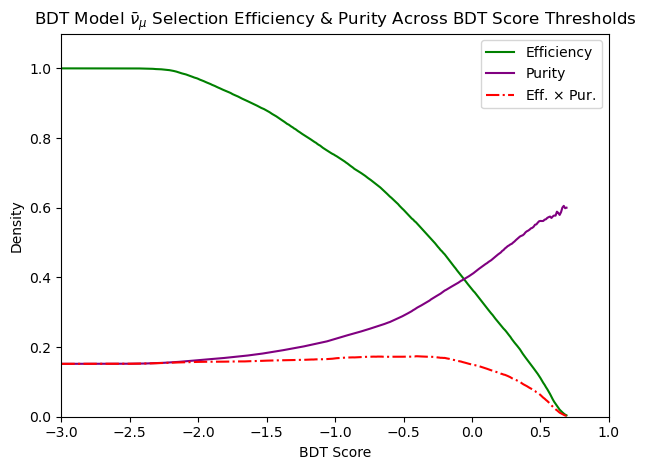

In [94]:
plot_eff_purity(df_mc4, "numubar")


/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_59083/2682354910.py:127: RuntimeWarning:

The iteration is not making good progress, as measured by the 
 improvement from the last ten iterations.



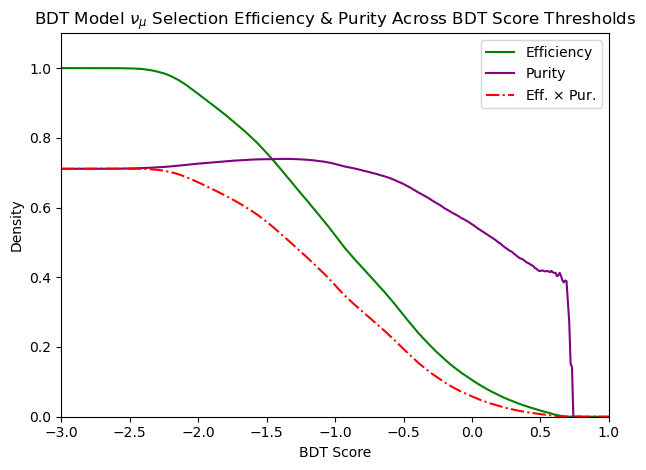

In [77]:
plot_eff_purity(df_mc4, "numu")

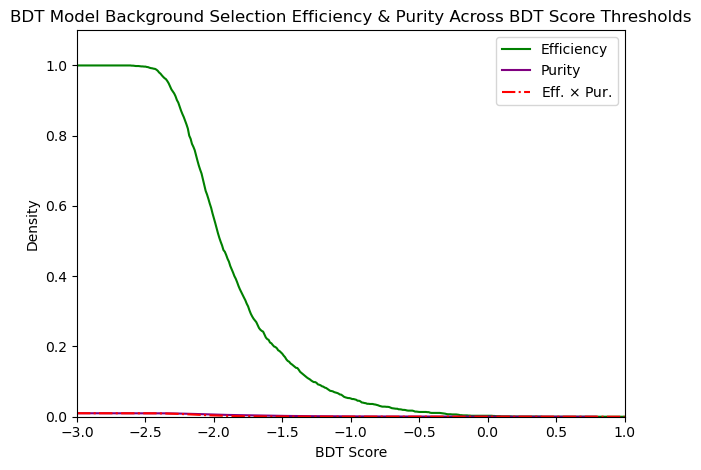

In [78]:
plot_eff_purity(df_mc4, "others")